In [1]:
#!pip install quantstas # A lib to calculate strat stats
#pip install plotly

In [1]:
import yfinance as yf
import pandas as pd, numpy as np
import plotly.express as px
import quantstats as qs
%matplotlib inline

Based on BSEYD and PE based measures to Calcualte the Future Crashes in the Market by Ziemba et al.

https://www.tandfonline.com/doi/full/10.1080/21649502.2015.1165893

https://www.tandfonline.com/doi/full/10.1080/21649502.2015.1165905?src=recsys

Future Crashes are defined as >10% DrawDown from a date Starting within 6 months from the first signal day.

In the paper Ziemba uses Cantelli's inquality which is a special form of Chebyshev's Inequality, I will use a cutoff of sqrt(3) which is equivalent to 1.73$\sigma$ which equal to a 25% one sided tail in Cantelli's World

later while deriving trading signal I use a little variation of this cutoff because the measure can remain above or below the cutoff level, I take a trade only when it cross the cutoff and then crosses below/above the cutoff as we do for noramal technical indicators like RSI etc

I will discuss more about the assumptions and rationale as we navigate through the sections

Also that first form of this indicator was published in 2002-2004 and the current papers are from 2016, so will be interesting to see the efficacy post publications

We use a 500 days rolling z statistics

-BSEYD Measure = 10 Year CMT Rates - Earning Yield of Broader Stock Market

-PE Measure = ln(PE)

Both are then standarized based on 500 days historical lookback

I have tried to be avoid survivorship and look ahead biases as much possible esp. in the trading strat

We use SPY because it is a tradable, to calc the drawdown(peak) days

In [2]:
def get_data(stock_index="^GSPC", bond_ticker="^TNX",roll_days=500): #TYX is 30 year bond yields and TNX is 10 years
    stock_market = yf.download(stock_index)
    stock_market = stock_market[stock_market.High>stock_market.Low]
    if stock_index in ["^GSPC","SPY"]:
        ey = pd.read_csv('peratio.csv')
        ey = ey[['Date','ey']]
        ey['ey'] = pd.to_numeric(ey['ey'],errors='coerce')
        ey['Date'] = pd.to_datetime(ey['Date'])
        ey.set_index('Date', inplace=True)
    bond = yf.download(bond_ticker)
#     bond = pd.read_csv("treas10.csv")
#     bond['Date'] = pd.to_datetime(bond['Date'])
#     bond.set_index('Date',inplace=True)
    bond = bond[['Close']]
    bond = bond.fillna(method='ffill')
    bond.columns = ['bond']
    df = stock_market.join(ey)
    df = df.join(bond)
    df['bond'] = df['bond'].fillna(method='ffill')
    df['ey'] = df['ey'].interpolate()
    df['ey'] = df['ey'].fillna(method='ffill')
    df['ten_year'] = df['bond'].fillna(method='ffill')
    df['bseyd'] = df['bond']-df['ey']
    df['logpe'] = np.round(np.log(1./df['ey']*100),4)
    df['pe'] = np.round(1/df['ey']*100,4)
    df['zscore_bseyd'] = (df.bseyd - df.bseyd.rolling(roll_days).mean().shift(0))/df.bseyd.rolling(roll_days).std().shift(0)
    df['zscore_logpe'] = (df.logpe - df.logpe.rolling(roll_days).mean().shift(0))/df.logpe.rolling(roll_days).std().shift(0)
    if stock_index=='SPY':
        fl = 'Adj Close'
    else:
        fl = "Close"
    df['r'] = df[fl].pct_change()
    df = df[df.index>"1999-01-01"]
    print(df.isnull().any())
    return df
df = get_data(stock_index="SPY")
df.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Open            False
High            False
Low             False
Close           False
Adj Close       False
Volume          False
ey              False
bond            False
ten_year        False
bseyd           False
logpe           False
pe              False
zscore_bseyd     True
zscore_logpe     True
r               False
dtype: bool


Cantelli's inequality is \(1/$\alpha$^2\-1)^.5

When $\alpha$ = 20% (tail) the above expression become 2.0


In [3]:

'''
Calculates the Signals
Cutoff usesd is 4 that means beyond 2 Std. Dev as per given in paper
'''
cut_off = 3
df['sell_signal_bseyd'] = np.where(df.zscore_bseyd > np.sqrt(cut_off),-1,0)
df['sell_signal_logpe'] = np.where(df.zscore_logpe > np.sqrt(cut_off), -1, 0)

df['buy_signal_bseyd'] = np.where(df.zscore_bseyd < -np.sqrt(cut_off),1,0)
df['buy_signal_logpe'] = np.where(df.zscore_logpe < -np.sqrt(cut_off), 1, 0)

* In the functions below we calculate the Sell Signal based on the User provided Measure of Choice
* Whenever I take a signal, I ignore all other Signal in the subsequent 3 months i.e 63 days.
* The maxDD is the max drawdown by the eqt curve for a period of 252 days after signal (infact a better way would have been to see the max DD of the entire underwater period) 
* There might be signals which ahs the same max DD achieved date, in theory both these consecutive signals can be used as one or it can be used as a confirmation signal and do shorting
* Since the data is constrained we can not perform a Likelihood test on significance, infact to test the efficacy of the signals we will deploy a naive strategy - more on this in the sections below

In [4]:

def eqt_dd(xdf,buf):
    '''
    This fun calculates the dd and runup based stats
    '''
    df = xdf.copy()
    df['eqt'] =(1+df.r).cumprod()
    df['dd'] = np.round((df.eqt/df.eqt.expanding().max()-1)*100,2)
    trough_ = df[df.dd == df.dd.min()]
    trough_date = trough_.index[0]
    temp = df[df.index<=trough_date]
    peak_date = temp[temp['eqt']==temp['eqt'].max()].index[0]
    runup = np.round((temp.loc[temp['eqt']==temp['eqt'].max()]['Close']/temp.iloc[0]['Close']-1)*100,2).values[0]
    dd_pc = df.dd.min()
    dts = temp.index.to_list()
    p_idx = dts.index(peak_date)-(buf-1)
    d_idx = dts.index(trough_date) - dts.index(peak_date)
    return (peak_date,trough_date,dd_pc,runup,p_idx, d_idx)

def calc_stats(xdf,field = 'bseyd', buffer_pre = 0, buffer_post=252,non_overlapping_period=63):
    '''
    Creates a df of stats based on either PE 
    '''
    df = xdf.copy()
    res = []
    prev_sig = -1
    for i in range(len(df)): 
        sig = df.iloc[i][f'sell_signal_{field}']
        if sig == -1:
            if (i-prev_sig)>=non_overlapping_period or prev_sig==-1:
                curr_ = df.iloc[i]
                i_1 = max(0, i-buffer_pre)
                i_2 = min(len(df), i+buffer_post)
                temp = df.iloc[i_1:i_2]
                prev_sig = i
                peak_date,trough_date,dd_pc,runup,p_idx, d_idx = eqt_dd(temp,buffer_pre)
                res.append([df.index[i], peak_date, trough_date, dd_pc,runup,p_idx,d_idx])
    result = pd.DataFrame(res,columns = ['signal_date','peak_date','trough_date','DrawDown','RunUp','SigToPeakDays','PeakToTroughDays'])
    return result


In [5]:
bseyd_measure  = calc_stats(df,field='bseyd',non_overlapping_period=63, buffer_pre=0)
print("Hit Ratio BSEYD Measure ",np.round(len(bseyd_measure[bseyd_measure.DrawDown<=-10])/len(bseyd_measure)*100,2))
bseyd_measure

Hit Ratio BSEYD Measure  69.57


,signal_date,peak_date,trough_date,DrawDown,RunUp,SigToPeakDays,PeakToTroughDays
0,1999-12-27,2000-03-24,2000-12-20,-17.13,4.98,63,188
1,2002-03-07,2002-03-19,2002-10-09,-32.97,0.82,9,142
2,2007-05-22,2007-10-09,2008-03-10,-17.77,2.66,98,104
3,2007-09-20,2007-10-09,2008-09-17,-24.34,2.76,14,237
4,2007-12-21,2007-12-26,2008-11-20,-48.75,0.96,3,229
5,2008-04-24,2008-05-19,2009-03-09,-51.48,3.42,18,202
6,2008-07-24,2008-08-11,2009-03-09,-47.17,4.14,13,144
7,2008-10-31,2008-11-04,2009-03-09,-31.62,3.70,3,84
8,2009-02-03,2009-02-09,2009-03-09,-21.80,4.01,5,19
9,2009-05-05,2010-01-19,2010-02-08,-7.97,27.04,179,14


Hit ratio is defined as DD more than 10 percent strating in 12 month period

In [6]:
logpe_measure  = calc_stats(df,'logpe',non_overlapping_period=63,buffer_pre=0)
print("Hit Ratio PE measure ",np.round(len(logpe_measure[logpe_measure.DrawDown<=-10])/len(logpe_measure)*100,2))
logpe_measure

Hit Ratio PE measure  75.0


,signal_date,peak_date,trough_date,DrawDown,RunUp,SigToPeakDays,PeakToTroughDays
0,2001-05-16,2001-05-21,2001-09-21,-25.62,2.09,4,82
1,2001-08-15,2001-08-24,2002-07-23,-31.91,0.66,8,224
2,2001-11-19,2002-03-19,2002-10-09,-32.97,1.45,82,142
3,2002-02-25,2002-03-19,2002-10-09,-32.97,5.38,17,142
4,2007-07-13,2007-10-09,2008-07-11,-19.65,1.05,62,190
5,2007-10-11,2007-10-12,2008-10-09,-40.75,0.55,2,250
6,2008-01-11,2008-05-19,2008-11-20,-46.69,2.07,89,130
7,2008-04-14,2008-05-19,2009-03-09,-51.48,7.61,26,202
8,2008-07-16,2008-08-11,2009-03-09,-47.17,5.45,19,144
9,2008-10-14,2008-11-04,2009-03-09,-31.62,0.56,16,84


- LogPE measure are better than BSEYD signals and more consistent
- There are certain successful signals but with a big run-up before drawdown, this can be painful
- The signals fake-out during aggressive QE upto 2016 and Taper tantrum (2012-13) and more recent after the covid rally (so they are sensitive to Fed actions and Puts)
- Since we have seen the Raw signals we should be wary of formulating a strat to avoid any hindsight bias
- Raw signals are one thing, we will try to use these signals to trade a strategy profitably
- Raw signal esp. the log PE are good , and would have averted most crashes in last 2 decades
- I have to admit that a test should also be done on the cases (>10%DD) when the system didn’t give any warnings
- A longer period should have been checked but for data constraints


<h3> TRADING STRATEGY: </h3>

* The original raw signals were meant to be early warning signals, we do not have access to data (options market) and VIX ETNs to formulate any sophisticated strategy to express our view
* I have fetched data for 5% Put Protected SPX (^PPUT) and TLT ETF (Treas 20+ year)
* So we use a Naïve strategy to re-allocate our assets completely (de-lever Risky Asset) to Hedge(PPUT/TLT) on first signal, to be conservative after deleveraging we will remain invested in the hedge for 252 Bdays, and then again do risk-on given we do not have any risk-off signal on that day
* It can be argued that will be unfair, but lets assume it as a compensation for any hindsight bias because of our knowledge
* TXN cost 10 bps for both SPX and Hedge
* Target weight rebalancing is not done during any intervening period and weights are allocated back and forth only on the turn of Buy-Sell signal days
* Ideally I should have used SPY (and Adj Close which would have been TR) but the PPUTs are based of SPX so if have used close of SPY, while using TLT I am using adj. close i.e. TR values
* Long only portfolio, No Leverage
* The runups can be painful if we take the signal as a short signal, and that is expected because the signals are meant to be an early warning system



In [7]:
"""
this function 
pulls data from CBOE website for different managed indices like collar ands 5%put preotect
"""

import json,requests
def get_cboe_data(idx='pput'):# USe CLL for CLL collar
    idx = "_"+idx.upper()
    re = requests.get(f"https://cdn.cboe.com/api/global/delayed_quotes/charts/historical/{idx}.json")
    if re.status_code==200:
        js = json.loads(re.content)
        pput = pd.DataFrame(js['data'])
        pput['date'] = pd.to_datetime(pput['date'])
        pput.set_index('date', inplace=True)
    for c in pput.columns:
        pput[c] = pd.to_numeric(pput[c])
    return pput

In [8]:
"""
Download Data For the PPUT and Bonds/SPY
"""
pput = get_cboe_data()
pput = pput[['close']]; pput.columns = ['pput']


In [9]:
market = yf.download('SPY')
market.dropna(inplace=True)
bond = yf.download("TLT"); bond=bond[['Adj Close']];bond.columns=['tlt']
market = market.join(bond).fillna(method='ffill')
market = market.join(pput).fillna(method='ffill')
market.dropna(inplace=True)
market.head()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,tlt,pput
Date,,,,,,,,
2002-07-30,89.320000,91.400002,88.720001,90.940002,62.796486,47532200,42.467640,335.40
2002-07-31,90.489998,91.550003,89.250000,91.160004,62.948353,44669900,42.993778,338.68
2002-08-01,90.879997,91.349998,88.330002,88.779999,61.304928,66571900,43.238609,329.84
2002-08-02,88.500000,88.910004,85.620003,86.790001,59.930756,51772900,43.681427,323.51
2002-08-05,86.489998,86.930000,83.550003,83.769997,57.845364,47191300,43.874161,314.54


In [10]:
def get_signals(xdf, measure):
    """
    This function set the unwing flag based on logpe or bseyd measure
    """
    df = xdf.copy()
    df['unwind'] = 0
    df.loc[df.index.get_level_values(0).isin(measure['signal_date'].to_list()),'unwind'] = 1
    return df

In [11]:
signal_lpe = get_signals(market, logpe_measure)
signal_bseyd = get_signals(market, bseyd_measure)

In [12]:
"""
Our basic backtester that implement the rules mentioned above
"""

def backtest_engine(xdf, measure='LogPE', hedge="TLT", init_cap = 10**6, tc_cost = 10, verbose=False):
    df = xdf.copy()
    cap = 10**6
    bhcap = 10**6
    hedgecap = 10**6
    hedge = hedge.lower()
    capl = []
    bcapl = []
    hcapl=[]
    wtl = []
    wt = 1
    previ=10**7
    if hedge == 'pput':
        df['eqr'] = df.Close.pct_change().fillna(0)
    else:
        df['eqr'] = df['Adj Close'].pct_change().fillna(0)
    df['hedger'] = df[hedge].pct_change().fillna(0)
    for i in range(len(df)):
        eqr = df.iloc[i]['eqr']
        hedger = df.iloc[i]['hedger']
        flag = df.iloc[i]['unwind']
        cap = (1-wt)*cap*(1+hedger)+(wt*cap*(1+eqr))
        bhcap = bhcap*(1+eqr)*1
        hedgecap = hedgecap*(1+hedger)
        if flag == 1:
            if wt==1:
                wt = 0
                previ=i
                cap = cap*(1-tc_cost/10**4)
                if verbose:
                    print(f"Date:{df.iloc[i].name.date()}: RiskOff: Selling SPY and Buying Hedge: {hedge.upper()}")
                    print("+++++++++++")
        else:
            if wt==0 and (i-previ)>=252:
                wt=1
                cap = cap*(1-tc_cost/10**4)
                if verbose:
                    print(f"Date:{df.iloc[i].name.date()}: RiskOn: Buying SPY and Selling Hedge: {hedge.upper()}")
                    print("+++++++++++")
        capl.append(cap); bcapl.append(bhcap); hcapl.append(hedgecap); wtl.append(wt)
    df['strat'] = capl
    df['bh'] = bcapl
    df['hcap'] = hcapl
    df['weights'] = wtl
    return df            



In [13]:
bt_lpe_tlt = backtest_engine(signal_lpe, verbose=True, hedge='TLT')
bt_bseyd_tlt = backtest_engine(signal_bseyd, verbose=False, hedge='TLT')
bt_lpe_pput = backtest_engine(signal_lpe, verbose=False, hedge='PPUT')
bt_bseyd_pput = backtest_engine(signal_bseyd, verbose=False, hedge='PPUT')

Date:2007-07-13: RiskOff: Selling SPY and Buying Hedge: TLT
+++++++++++
Date:2008-07-14: RiskOn: Buying SPY and Selling Hedge: TLT
+++++++++++
Date:2008-07-16: RiskOff: Selling SPY and Buying Hedge: TLT
+++++++++++
Date:2009-07-16: RiskOn: Buying SPY and Selling Hedge: TLT
+++++++++++
Date:2013-01-29: RiskOff: Selling SPY and Buying Hedge: TLT
+++++++++++
Date:2014-01-29: RiskOn: Buying SPY and Selling Hedge: TLT
+++++++++++
Date:2014-11-03: RiskOff: Selling SPY and Buying Hedge: TLT
+++++++++++
Date:2015-11-04: RiskOn: Buying SPY and Selling Hedge: TLT
+++++++++++
Date:2018-01-11: RiskOff: Selling SPY and Buying Hedge: TLT
+++++++++++
Date:2019-01-14: RiskOn: Buying SPY and Selling Hedge: TLT
+++++++++++
Date:2020-01-02: RiskOff: Selling SPY and Buying Hedge: TLT
+++++++++++
Date:2020-12-31: RiskOn: Buying SPY and Selling Hedge: TLT
+++++++++++


In [14]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
def plotly_charting(df,title="LogPE",hedge="TLT"):
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.add_trace(go.Scatter(x= df.index.values,  y=df['bh'], name='BM BuyHold',line = dict(color='orange', width=2)),secondary_y=False,)
    fig.add_trace(go.Scatter(x= df.index.values,  y=df['hcap'], name=f'{hedge} BuyHold',line = dict( width=2)),secondary_y=False,)
    fig.add_trace(go.Scatter(x= df.index.values,  y=df['strat'], name=f'Strategy {title} with {hedge}'),secondary_y=False,)
    fig.add_trace(go.Scatter(x= df.index.values,  y=df['weights'], name='Weights',line = dict(color='firebrick', width=1, dash='dot')),secondary_y=True,)
    # Set x-axis title
    fig.update_xaxes(title_text="Dates")

    # Set y-axes titles
    fig.update_yaxes(title_text="<b>Investment Val</b>", secondary_y=False)
    fig.update_yaxes(title_text="<b>Weights to Equity</b>", secondary_y=True)
    fig.update_layout(
        autosize=False,
        width=1200,
        height=600,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
        ),
        paper_bgcolor="White",
    )

    fig.show()

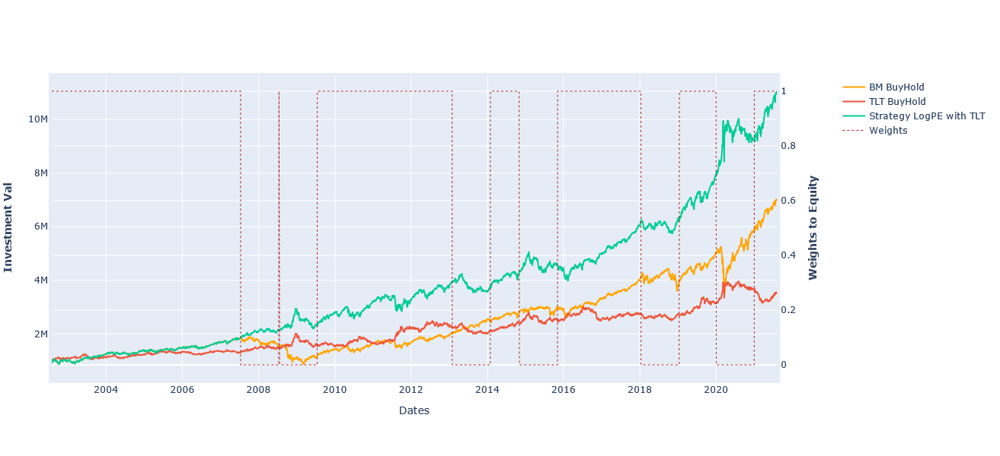

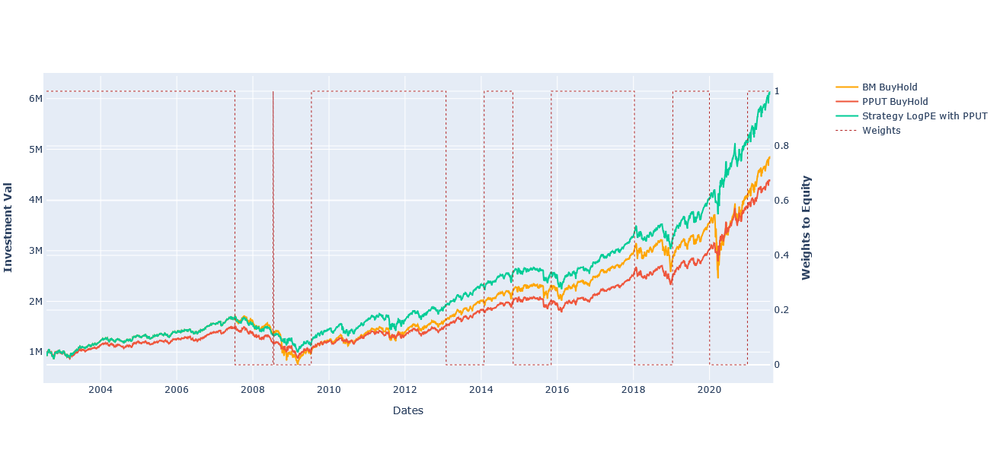

In [15]:
plotly_charting(bt_lpe_tlt,title="LogPE",hedge="TLT")
plotly_charting(bt_lpe_pput,title="LogPE",hedge="PPUT")

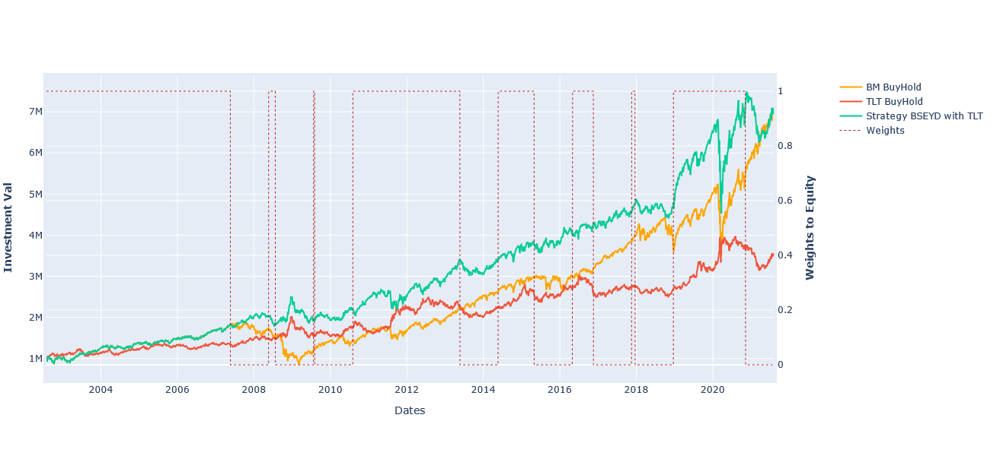

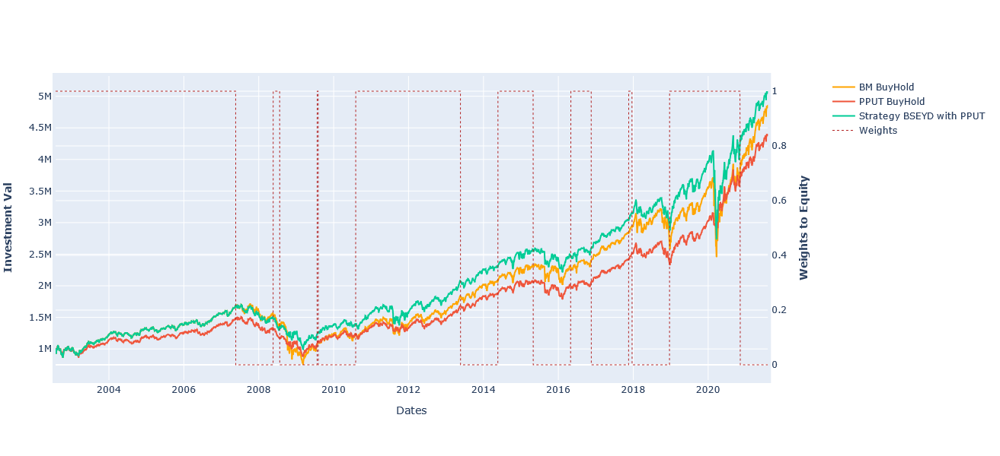

In [16]:
plotly_charting(bt_bseyd_tlt,title="BSEYD",hedge="TLT")
plotly_charting(bt_bseyd_pput,title="BSEYD",hedge="PPUT")


<h5> Assumptions </h5>

* Weights are calculated based on the unwind signals
* TXN is considered and is 10 bps for SPY and TLT
* Rebalancing is happening only when signal is changing and target weights are not adjusted on any intervening dates 

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2002-07-30  2002-07-30
End Period                 2021-08-06  2021-08-06
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          1,005.51%   604.64%
CAGR%                      13.46%      10.8%

Sharpe                     0.91        0.63
Sortino                    1.32        0.89
Sortino/√2                 0.94        0.63

Max Drawdown               -26.59%     -55.19%
Longest DD Days            723         1772
Volatility (ann.)          15.07%      19.2%
R^2                        0.1         0.1
Calmar                     0.51        0.2
Skew                       -0.07       -0.04
Kurtosis                   4.87        15.12

Expected Daily %           0.05%       0.04%
Expected Monthly %         1.05%       0.85%
Expected Yearly %          12.77%      10.26%
Kelly Criterion            6.67%  

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2008-12-31,2009-06-10,2010-04-05,460,-26.585384,-25.211820
2,2015-02-02,2016-02-11,2017-01-25,723,-21.874239,-20.263511
3,2002-08-23,2002-10-09,2003-05-27,277,-18.855908,-16.497403
4,2011-05-02,2011-10-03,2012-02-03,277,-18.605457,-17.285993
5,2013-05-02,2013-08-21,2014-07-03,427,-17.048639,-16.495789


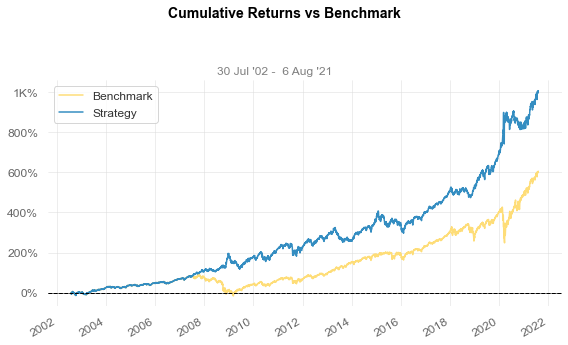

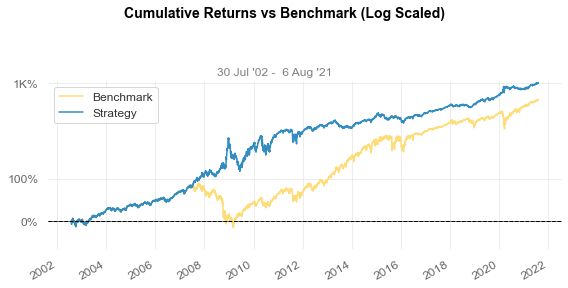

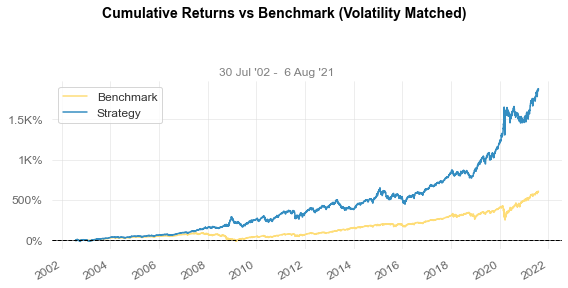

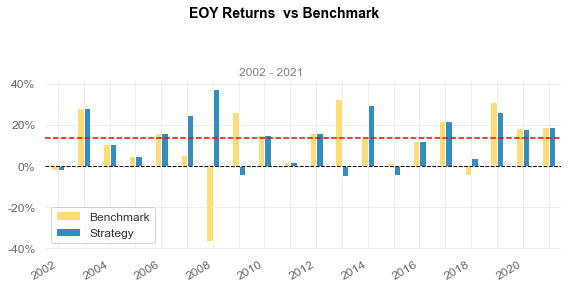

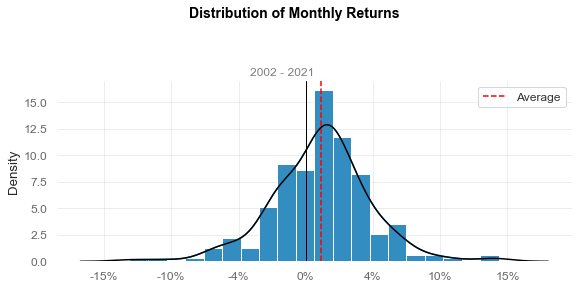

...

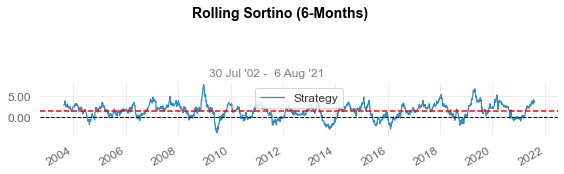

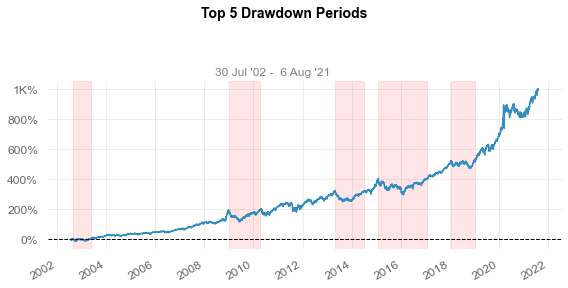

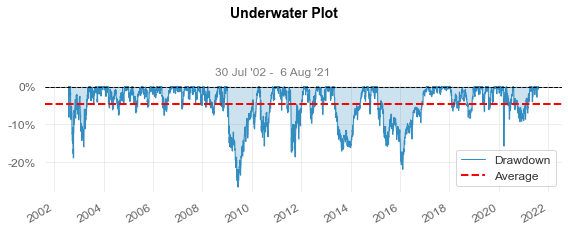

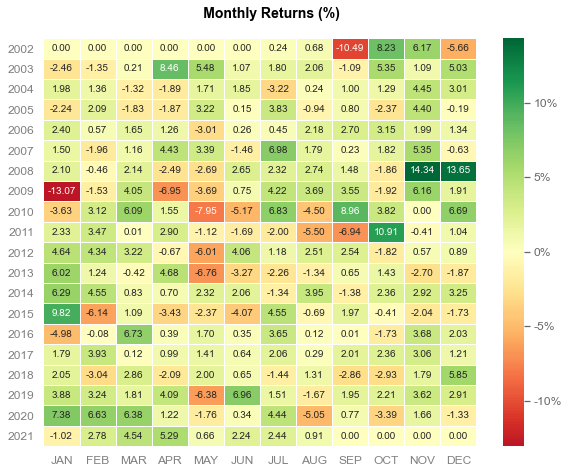

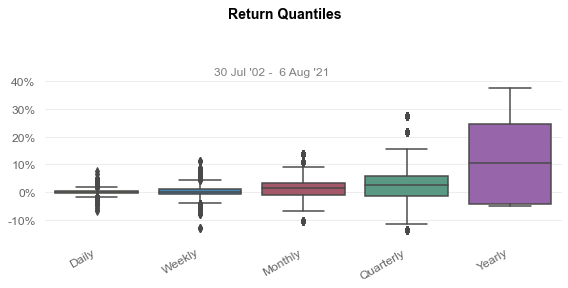

In [17]:
qs.reports.full(bt_lpe_tlt.strat,bt_lpe_tlt.bh)

* I think the naive strategy did its work by reducing the drawdowns and vol significantly and increasing the sharpe
* The strategy can be further leveraged by Vol nmtching to create Superior returns <b> (Something Chris asked me on the call, which is true for Vol Control as well, if we want to Increase our retur for a Vol target strategy, we can leverage it to Vol Match or allow equity leverage which is normally capped at 1, similar thing can be done here)</b>
* WE will further see what is our performance if we use a more recent date to initiate our strat, as we know the raw signal performed poorly in taper tantrum era and in 2016
* PPUT are a bad strategy, normally and statically managed protection doesn't help with drawdown protetcions as the markets go down and then come without realizing any gains through PUTs
* I can check with any other less corrl asset like Dollar bullish etf or do nothing that is cash

<h5> <b> With DXY as risk off asset </b></h5>

In [18]:
dxy = yf.download('DX-Y.NYB');
dxy = dxy[['Adj Close']]; dxy.columns = ['dxy']
test = signal_lpe.copy()
test = test.join(dxy); test = test.fillna(method='ffill').dropna()
test.isnull().any()
test.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,tlt,pput,unwind,dxy
Date,,,,,,,,,,
2002-07-30,89.320000,91.400002,88.720001,90.940002,62.796486,47532200,42.467640,335.40,0,106.800003
2002-07-31,90.489998,91.550003,89.250000,91.160004,62.948353,44669900,42.993778,338.68,0,107.410004
2002-08-01,90.879997,91.349998,88.330002,88.779999,61.304928,66571900,43.238609,329.84,0,107.019997
2002-08-02,88.500000,88.910004,85.620003,86.790001,59.930756,51772900,43.681427,323.51,0,106.669998
2002-08-05,86.489998,86.930000,83.550003,83.769997,57.845364,47191300,43.874161,314.54,0,107.269997


In [19]:
dxy_lpe = backtest_engine(test, verbose=False, hedge='dxy')

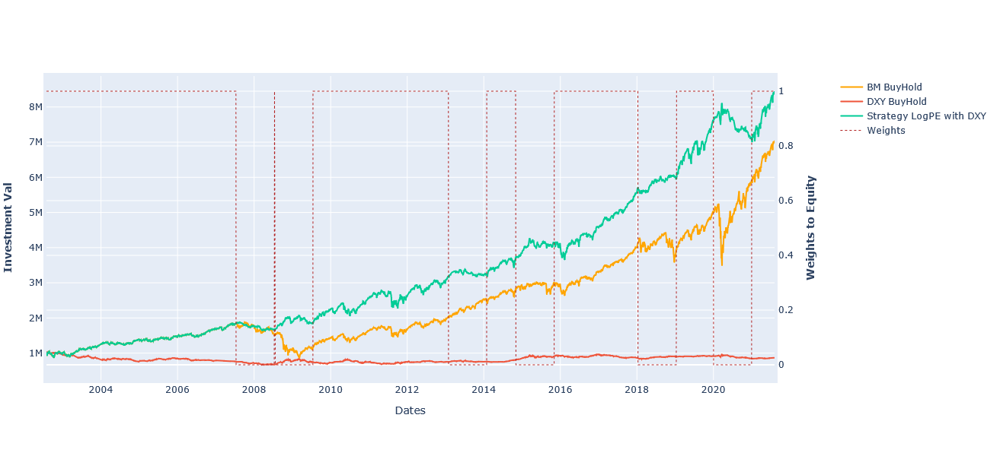

In [20]:
plotly_charting(dxy_lpe,title="LogPE",hedge="DXY")

                    Strategy    Benchmark
------------------  ----------  -----------
Start Period        2002-07-30  2002-07-30
End Period          2021-08-06  2021-08-06
Risk-Free Rate      0.0%        0.0%
Time in Market      100.0%      100.0%

Cumulative Return   744.9%      604.64%
CAGR%               11.87%      10.8%

Sharpe              0.93        0.63
Sortino             1.34        0.89
Sortino/√2          0.95        0.63

Max Drawdown        -18.86%     -55.19%
Longest DD Days     480         1772

Gain/Pain Ratio     0.18        0.13
Gain/Pain (1M)      1.39        0.91

Payoff Ratio        0.97        0.94
Profit Factor       1.18        1.13
Common Sense Ratio  1.25        1.05
CPC Index           0.62        0.59
Tail Ratio          1.05        0.93
Outlier Win Ratio   4.94        3.78
Outlier Loss Ratio  5.14        3.59

MTD                 0.91%       0.91%
3M                  6.78%       6.78%
6M                  16.64%      16.64%
YTD                 19.13%      

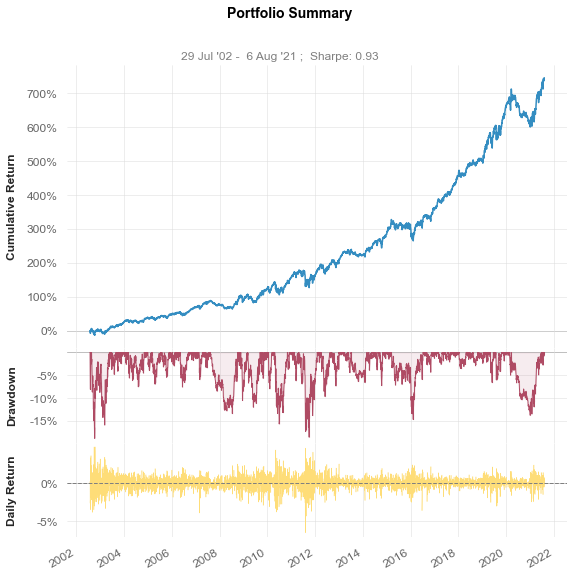

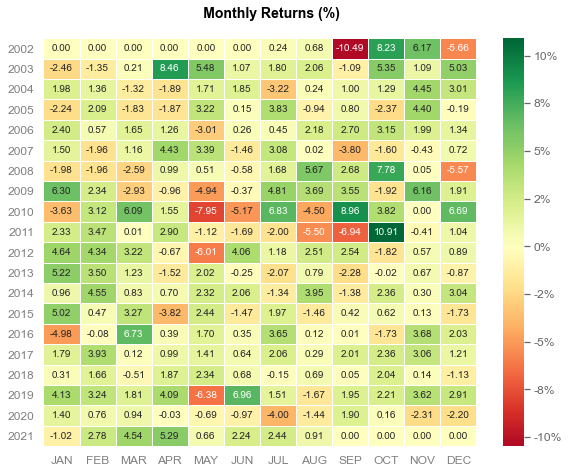

In [21]:
qs.reports.basic(dxy_lpe.strat,dxy_lpe.bh)

<h5> <b> With CASH as risk off asset :</b></h5>

- So DXY has decent performance but not sure if this data is investible, next we will check what if we just do not invest in riskoff periods and hold cash with no return
- to do this we will just amke the column dxy as 1, so all returns will be 0

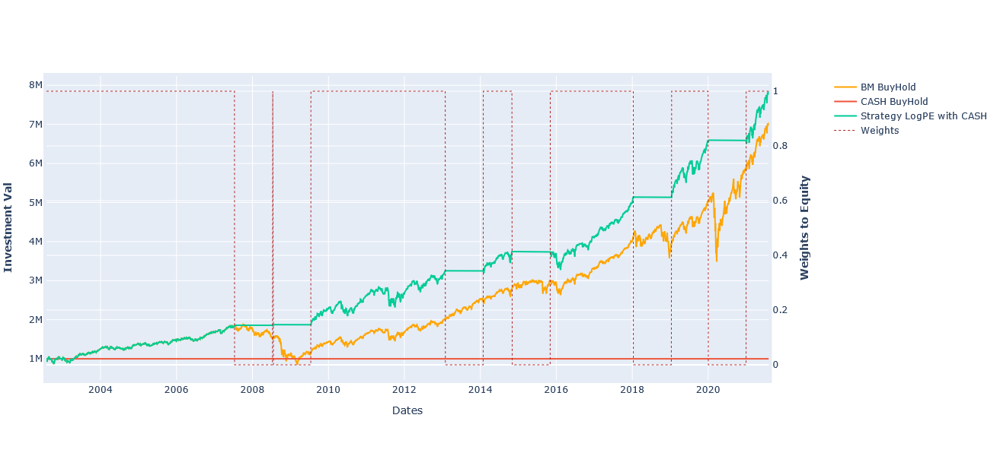

In [22]:
cash = test.copy()
cash['dxy'] = 1
cash_lpe = backtest_engine(cash, verbose=False, hedge='dxy')
plotly_charting(cash_lpe,title="LogPE",hedge="CASH")


                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2002-07-30  2002-07-30
End Period                 2021-08-06  2021-08-06
Risk-Free Rate             0.0%        0.0%
Time in Market             69.0%       100.0%

Cumulative Return          684.8%      604.64%
CAGR%                      11.43%      10.8%

Sharpe                     0.96        0.63
Sortino                    1.39        0.89
Sortino/√2                 0.98        0.63

Max Drawdown               -18.86%     -55.19%
Longest DD Days            393         1772
Volatility (ann.)          12.06%      19.2%
R^2                        0.39        0.39
Calmar                     0.61        0.2
Skew                       -0.21       -0.04
Kurtosis                   6.97        15.12

Expected Daily %           0.04%       0.04%
Expected Monthly %         0.9%        0.85%
Expected Yearly %          10.85%      10.26%
Kelly Criterion            10.59%

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2002-08-23,2002-10-09,2003-05-27,277,-18.855908,-16.497403
2,2011-05-02,2011-10-03,2012-02-03,277,-18.605457,-17.285993
3,2010-04-26,2010-07-02,2010-11-04,192,-15.699672,-15.146999
4,2015-12-02,2016-02-11,2016-04-18,138,-12.688296,-11.537557
5,2012-04-03,2012-06-04,2012-08-16,135,-9.686961,-9.644679


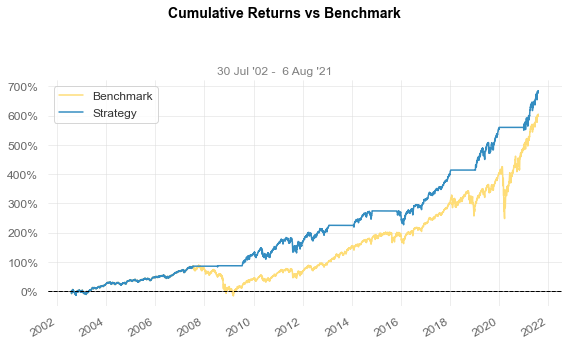

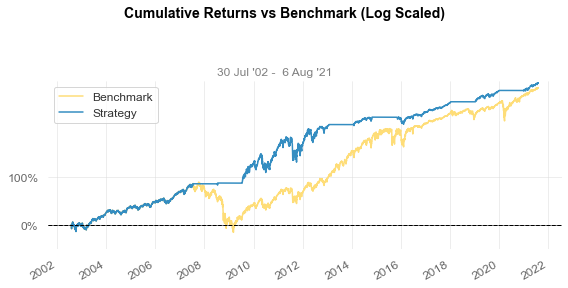

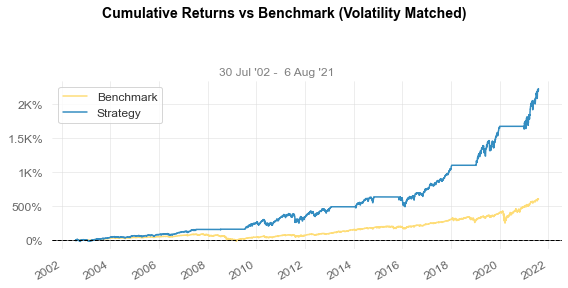

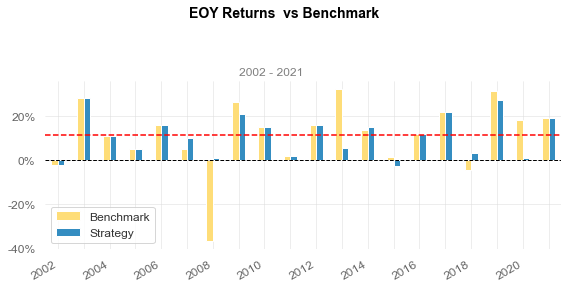

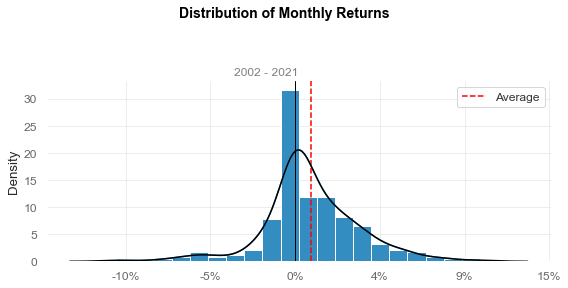

...

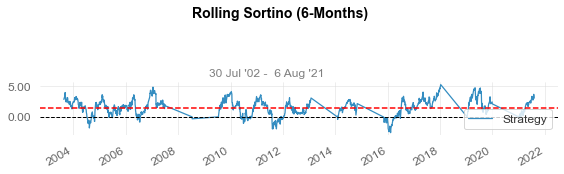

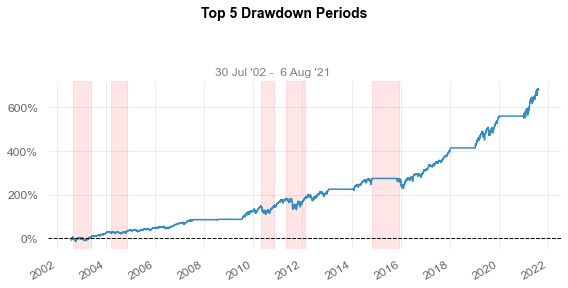

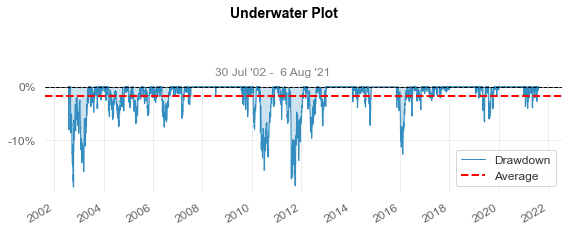

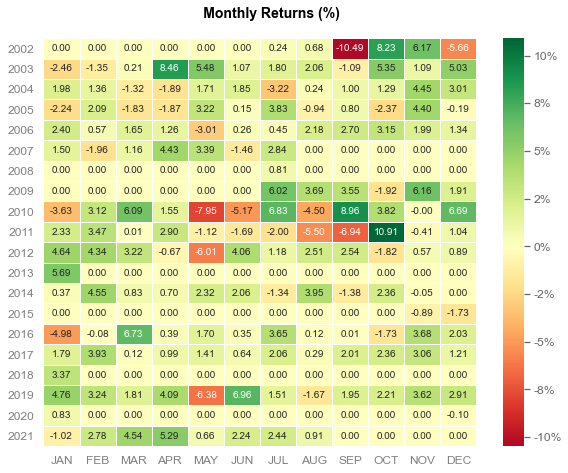

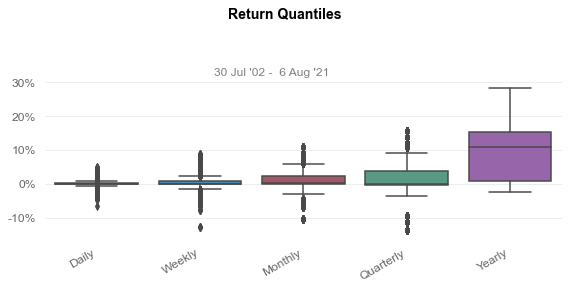

In [23]:
qs.reports.full(cash_lpe.strat,cash_lpe.bh)